## Сегментация изображений клеток

Вам предстоит обучить модель сегментировать изображения с дрожжевыми клетками и микроструктурами (см. [06_segmentation.ipynb](../workshops/06_segmentation.ipynb)), по пути поэкспериментировав с разными архитектурами и функцими ошибки.

### Задание 1 (2 балл). Метрики сегментации
Перед экспериментами нужно определиться с метриками. Выберите 3-5 метрик, по которым вы будете оценивать качество модели. В этом задании объясните свой выбор и найдите нужные метрики в `torchvision` (а если их нет - реализуйте самостоятельно, здесь вам может помочь [05_lightning_etc.ipynb](../workshops/05_lightning_etc.ipynb))

In [1]:
from os import mkdir
from pathlib import Path


import lightning as L
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from numpy.ma.core import outer
from torch import Tensor
from torch.utils.data import Dataset
from torchvision import transforms
import torchmetrics.classification
from typing import Any
from lightning.pytorch.utilities.types import STEP_OUTPUT

def create_classification_metrics(
    num_classes: int, prefix: str
) -> torchmetrics.MetricCollection:
    return torchmetrics.MetricCollection(
        [
            torchmetrics.Accuracy(task="multiclass", num_classes=num_classes),
            torchmetrics.Precision(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.Recall(task="multiclass", num_classes=num_classes, average="macro"),
            torchmetrics.JaccardIndex(task="multiclass", num_classes=num_classes),
            torchmetrics.Dice(num_classes=num_classes, average="macro"),
        ],
        prefix=prefix,
    )


### Задание 2 (4 балла). Обучение модели
Возьмите модель и датасеты из практики по сегментации и запустите обучение.

Указания:
- Каждую эпоху сохраняйте значения ошибки и выбранные в задании 1 метрики как для обучающего датасета (`train`), так и для валидационного (`val`).
- Каждую эпоху сохраняйте примеры работы модели на 8 случайных изображениях из валидационного датасета (одной картинкой, как в практике).
- После окончания обучения выведите графики значений ваших метрик и примеры предсказаний (достаточно 4-5 изображений: для первой эпохи, 2-3 в середине обучения и ндля последней эпохи).
- Можете использовать `lightning` (вместо `lightning.pytorch.loggers.TensorBoardLogger` можно использовать `lightning.pytorch.loggers.CSVLogger`, а сохранение изображений можете реализовать как `lightning.pytorch.Callback`), а можете всё написать вручную.

In [9]:
# ! wget https://tudatalib.ulb.tu-darmstadt.de/bitstream/handle/tudatalib/3799/yeast_cell_in_microstructures_dataset.zip
# ! unzip yeast_cell_in_microstructures_dataset.zip -d yeast_cell_in_microstructures_dataset

In [2]:


class YeastDataset(Dataset):
    def __init__(self, subset_dir: Path) -> None:
        super().__init__()
        self.subset_dir = subset_dir
        self.items = list((self.subset_dir / "inputs").glob("*.pt"))
        self.items = self.items[0:int(len(self.items)/8)*8]

    def __getitem__(self, index: int) -> tuple[Tensor, dict[str, Tensor]]:
        # нужно вернуть пару
        # тензор изображения C x W x H
        # словарь с ключами boxes, masks, labels
        image_path = self.items[index]
        image = torch.load(image_path, weights_only=True).unsqueeze(
            0
        )  # (W, H) -> (1, W, H)
        classes = (
            torch.load(
                self.subset_dir / "classes" / image_path.parts[-1], weights_only=True
            )
            + 1
        )  # 0 класс - фон
        masks = torch.load(
            self.subset_dir / "instances" / image_path.parts[-1], weights_only=True
        )
        boxes = torch.load(
            self.subset_dir / "bounding_boxes" / image_path.parts[-1], weights_only=True
        )
        return image, dict(
            boxes=boxes,
            labels=classes,
            masks=masks,
        )

    def __len__(self) -> int:
        return len(self.items)

In [3]:
class YeastSemanticSegmDataset(YeastDataset):
    def __getitem__(self, index: int) -> tuple[Tensor, Tensor]:
        image, annotation = super().__getitem__(index)
        # нужно сформировать маску: тензор размера W x H, где для каждого пиксела указан класс
        mask = (
            (annotation["masks"] * annotation["labels"].view(-1, 1, 1)).sum(dim=0)
        ).long()

        return image, mask

In [6]:
from typing import Any, Callable, Type

from lightning.pytorch.utilities.types import EVAL_DATALOADERS, TRAIN_DATALOADERS
from torch.utils.data import DataLoader

_collate_fn_t = Callable[[list[tuple[Tensor, Any]]], Any]


class Datamodule(L.LightningDataModule):
    def __init__(
        self,
        datadir: Path,
        dataset_class: Type[Dataset],
        batch_size: int,
        train_subdir: str = "train",
        val_subdir: str = "val",
        test_subdir: str = "test",
    ) -> None:
        super().__init__()
        self.batch_size = batch_size
        self.dataset_class = dataset_class
        self.train_dir = datadir / train_subdir
        self.val_dir = datadir / val_subdir
        self.test_dir = datadir / test_subdir

    @property
    def collate_fn(self) -> _collate_fn_t | None:
        if self.dataset_class == YeastSemanticSegmDataset:
            return None
        else:
            return lambda batch: tuple(zip(*batch))

    def setup(self, stage: str) -> None:
        if stage in ("fit", "validate"):
            self.val_dataset = self.dataset_class(self.val_dir)
        if stage == "fit":
            self.train_dataset = self.dataset_class(self.train_dir)
        elif stage == "test":
            self.test_dataset = self.dataset_class(self.test_dir)

    def train_dataloader(self) -> TRAIN_DATALOADERS:
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            collate_fn=self.collate_fn,
        )

    def val_dataloader(self) -> EVAL_DATALOADERS:
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            collate_fn=self.collate_fn,
        )

    def test_dataloader(self) -> EVAL_DATALOADERS:
        return DataLoader(
            self.test_dataset,
            batch_size=self.batch_size,
            shuffle=False,
            collate_fn=self.collate_fn,
        )

In [9]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(
        self, in_channels: int, out_channels: int, mid_channels: int | None = None
    ) -> None:
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.double_conv(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels: int, out_channels: int) -> None:
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2), DoubleConv(in_channels, out_channels)
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(
        self, in_channels: int, out_channels: int, bilinear: bool = True
    ) -> None:
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2, kernel_size=2, stride=2
            )
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x_prev: Tensor, x_skip: Tensor) -> Tensor:
        x_prev = self.up(x_prev)
        # input is BCHW
        d_height = x_skip.size()[2] - x_prev.size()[2]
        d_width = x_skip.size()[3] - x_prev.size()[3]

        x_prev = F.pad(
            x_prev,
            [
                d_width // 2,
                d_width - d_width // 2,
                d_height // 2,
                d_height - d_height // 2,
            ],
        )
        x = torch.cat([x_skip, x_prev], dim=1)
        return self.conv(x)

In [10]:
class UNet(nn.Module):
    def __init__(
        self,
        n_channels: int,
        n_classes: int,
        channel_sizes: list[int],
        bilinear: bool = False,
    ):
        super().__init__()
        self.in_conv = DoubleConv(in_channels=n_channels, out_channels=channel_sizes[0])
        self.downscaler = self.create_downscaler(channel_sizes, bilinear)
        self.upscaler = self.create_upscaler(channel_sizes[::-1], bilinear)
        self.head = nn.Conv2d(channel_sizes[0], n_classes, kernel_size=1)

    @classmethod
    def create_downscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        если используется билинейная интерполяция вместо обратной свёртки,
        то размер последнего (самого большого) канала делаем вдвое меньше

        Args:
            channel_sizes (list[int]): список размеров каналов, напр. [16, 32, 64]
            bilinear (bool, optional): если True, в модели используется билинейная интерполяция
                для выравнивания размеров активаций.
        """
        factor = 2 if bilinear else 1
        down_factors = [1] * (len(channel_sizes) - 2) + [factor]
        return nn.ModuleList(
            [
                Down(fin, fout // dfactor)
                for fin, fout, dfactor in zip(
                    channel_sizes[:-1], channel_sizes[1:], down_factors
                )
            ]
        )

    @classmethod
    def create_upscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        Если используется билинейная интерполяция вместо обратной свёртки,
        то размер первого (самого большого) канала делаем вдвое меньше

        Args:
            channel_sizes (list[int]): список размеров каналов, напр. [16, 32, 64]
            bilinear (bool, optional): если True, в модели используется билинейная интерполяция
                для выравнивания размеров активаций.
        """
        factor = 2 if bilinear else 1
        up_factors = [factor] * (len(channel_sizes) - 2) + [1]
        return nn.ModuleList(
            [
                Up(fin, fout // ufactor, bilinear=bilinear)
                for fin, fout, ufactor in list(
                    zip(channel_sizes[:-1], channel_sizes[1:], up_factors)
                )
            ]
        )

    def forward(self, x: Tensor) -> Tensor:
        # создаём список для хранения промежуточных активаций
        xs = []
        # делаем входную свёртку
        x = self.in_conv(x)

        # downscaling
        for conv in self.downscaler:
            xs.append(x)
            x = conv(x)

        # разворачиваем промежуточные активации и делаем upscaling
        xs.reverse()
        for conv, act in zip(self.upscaler, xs):
            x = conv(x, act)

        # финальная свёртка для получения логитов пикселей
        logits = self.head(x)
        return logits

In [ ]:
import os
import pandas as pd
import lightning as L
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.utils import save_image
from torchmetrics import MetricCollection
from typing import Any


def print_result(predictions, images):
    original_images_grid = torchvision.utils.make_grid(images, nrow=4, normalize=True)
    masks_grid = torchvision.utils.make_grid(
        torch.nn.functional.one_hot(predictions.argmax(dim=1), 3).permute(0, 3, 1, 2)[:, 1:]
        > 0,
        nrow=4,
    )

    predictions_grid = torchvision.utils.draw_segmentation_masks(
        original_images_grid,
        masks=masks_grid,
        alpha=0.4,
        colors=["red", "green"],
    )

    plt.figure(figsize=(12, 5))
    plt.axis("off")
    plt.imshow(transforms.ToPILImage()(predictions_grid))

metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassAccuracy": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

def update(res):
  for h in metrics_for_plot:
    metrics_for_plot[h].append(float(res[h]))



class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = F.cross_entropy(y_hat, y)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = F.cross_entropy(y_hat, y)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_accuracy = self.trainer.callback_metrics["val_MulticlassAccuracy"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. Accuracy: {val_accuracy:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 268 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
268 K     Trainable params
0         Non-trainable params
268 K     Total params
1.074     Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.1880,
 Val. Accuracy: 0.0827,
 Val. Recall: 0.3333,
 Val. Precision: 0.0276,
 Val. MulticlassJaccardIndex: 0.0276,
 Val. MulticlassDice: 0.0509



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.4901,
 Val. Accuracy: 0.9256,
 Val. Recall: 0.9255,
 Val. Precision: 0.8433,
 Val. MulticlassJaccardIndex: 0.7896,
 Val. MulticlassDice: 0.8786



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3265,
 Val. Accuracy: 0.9569,
 Val. Recall: 0.9363,
 Val. Precision: 0.9174,
 Val. MulticlassJaccardIndex: 0.8664,
 Val. MulticlassDice: 0.9266



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.3680,
 Val. Accuracy: 0.8883,
 Val. Recall: 0.9342,
 Val. Precision: 0.7907,
 Val. MulticlassJaccardIndex: 0.7338,
 Val. MulticlassDice: 0.8392



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.2079,
 Val. Accuracy: 0.9522,
 Val. Recall: 0.8742,
 Val. Precision: 0.9538,
 Val. MulticlassJaccardIndex: 0.8380,
 Val. MulticlassDice: 0.9078



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1568,
 Val. Accuracy: 0.9624,
 Val. Recall: 0.9247,
 Val. Precision: 0.9456,
 Val. MulticlassJaccardIndex: 0.8799,
 Val. MulticlassDice: 0.9345



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1411,
 Val. Accuracy: 0.9677,
 Val. Recall: 0.9538,
 Val. Precision: 0.9395,
 Val. MulticlassJaccardIndex: 0.9000,
 Val. MulticlassDice: 0.9465



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1351,
 Val. Accuracy: 0.9690,
 Val. Recall: 0.9471,
 Val. Precision: 0.9490,
 Val. MulticlassJaccardIndex: 0.9028,
 Val. MulticlassDice: 0.9480



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1305,
 Val. Accuracy: 0.9699,
 Val. Recall: 0.9512,
 Val. Precision: 0.9486,
 Val. MulticlassJaccardIndex: 0.9059,
 Val. MulticlassDice: 0.9499



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1273,
 Val. Accuracy: 0.9702,
 Val. Recall: 0.9493,
 Val. Precision: 0.9510,
 Val. MulticlassJaccardIndex: 0.9064,
 Val. MulticlassDice: 0.9501



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.


 Val. Loss: 0.1240,
 Val. Accuracy: 0.9704,
 Val. Recall: 0.9521,
 Val. Precision: 0.9494,
 Val. MulticlassJaccardIndex: 0.9075,
 Val. MulticlassDice: 0.9508



LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1240,
 Val. Accuracy: 0.9704,
 Val. Recall: 0.9521,
 Val. Precision: 0.9494,
 Val. MulticlassJaccardIndex: 0.9075,
 Val. MulticlassDice: 0.9508

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.9507694244384766
  val_MulticlassAccuracy      0.9703639149665833
val_MulticlassJaccardIndex    0.9074559211730957
 val_MulticlassPrecision      0.9494385719299316
   val_MulticlassRecall       0.9521092176437378
         val_loss             0.1239963099360466
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.1239963099360466,
  'val_MulticlassAccuracy': 0.9703639149665833,
  'val_MulticlassPrecision': 0.9494385719299316,
  'val_MulticlassRecall': 0.9521092176437378,
  'val_MulticlassJaccardIndex': 0.9074559211730957,
  'val_Dice': 0.9507694244384766}]

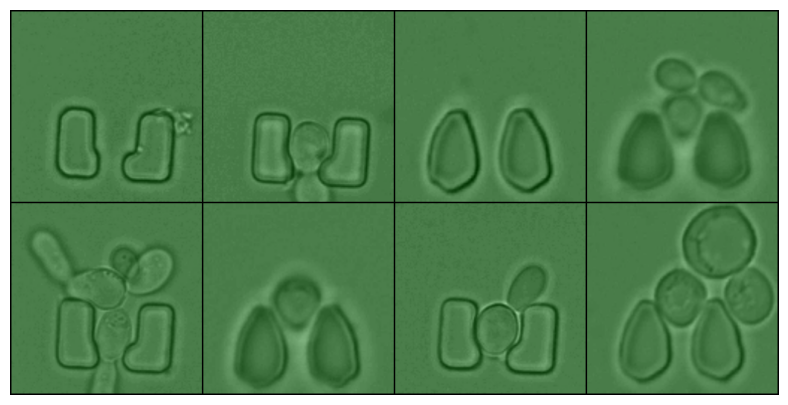

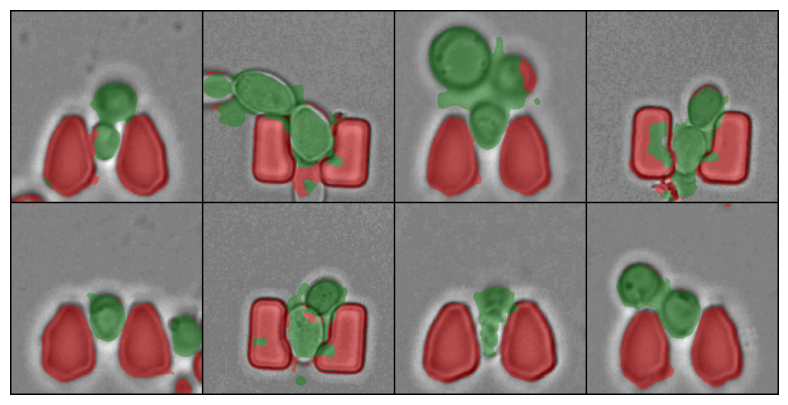

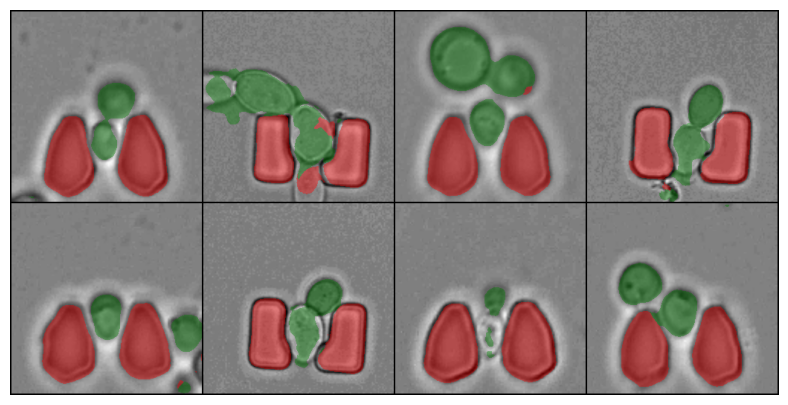

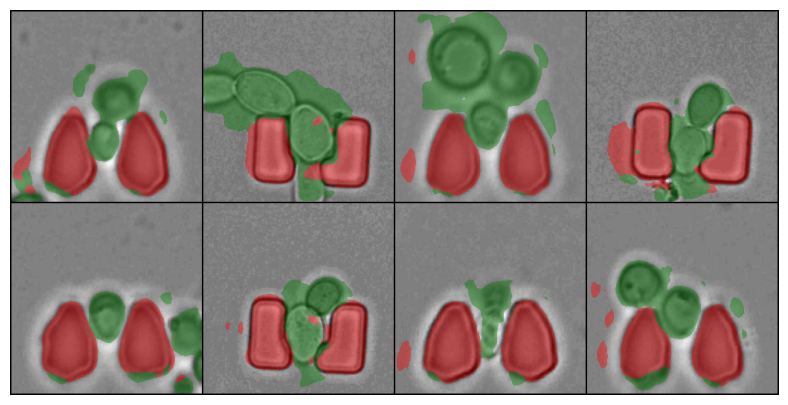

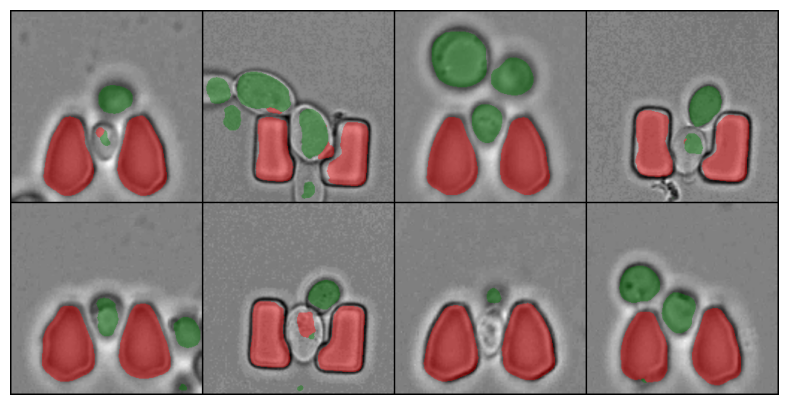

...

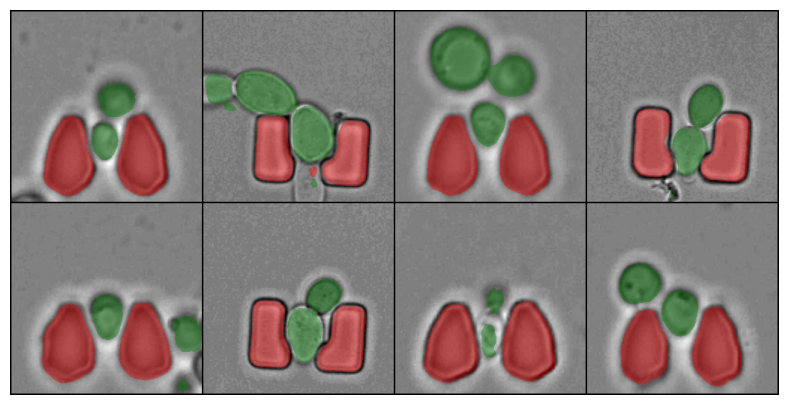

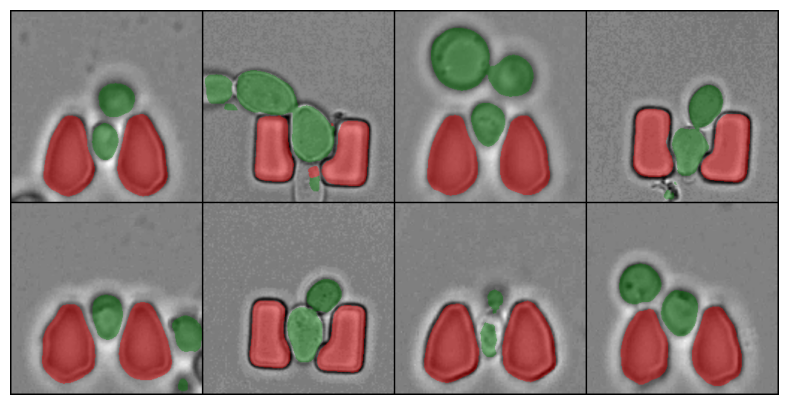

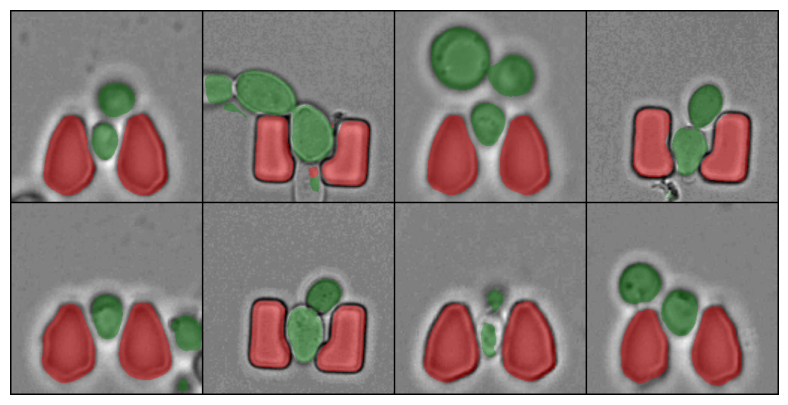

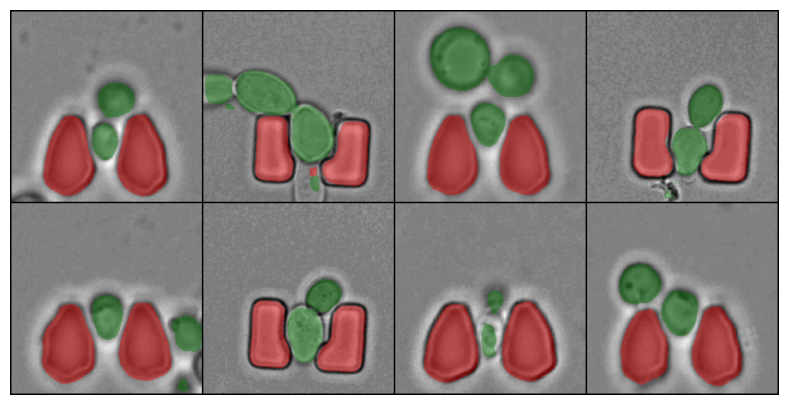

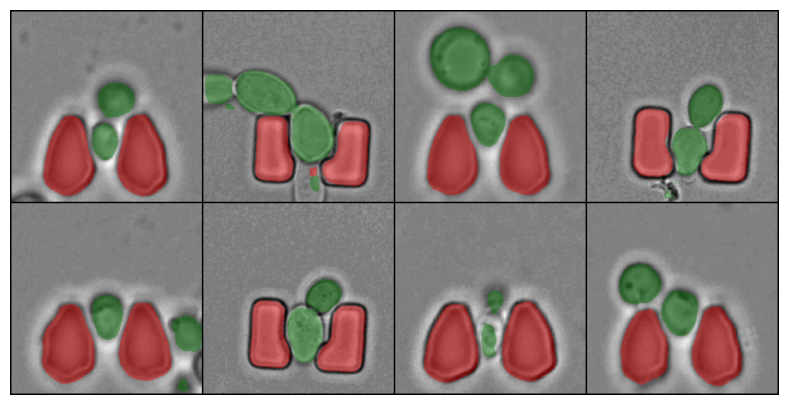

In [49]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))
trainer = L.Trainer(
    accelerator="auto",
    max_epochs=10,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())


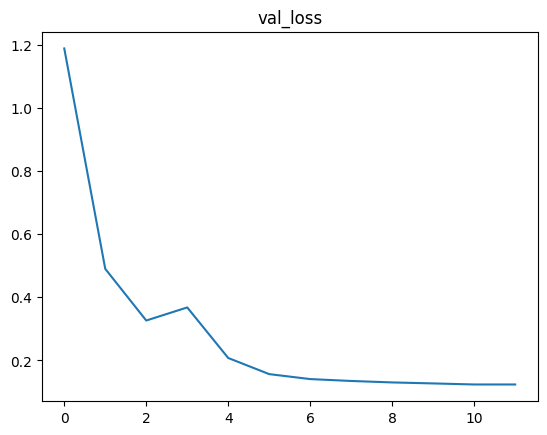

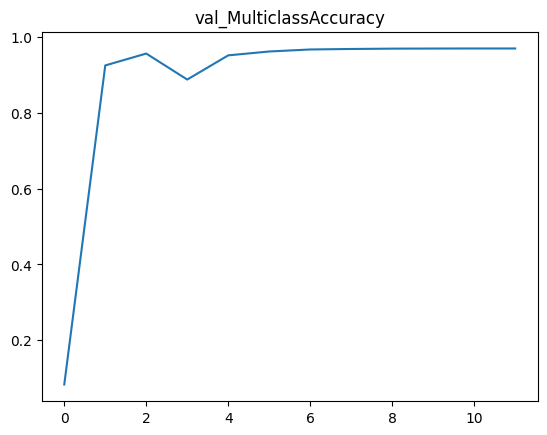

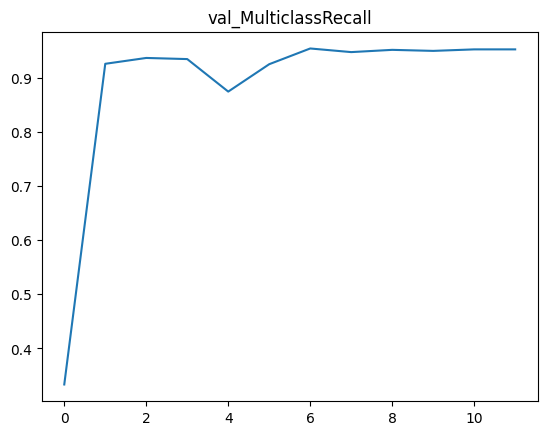

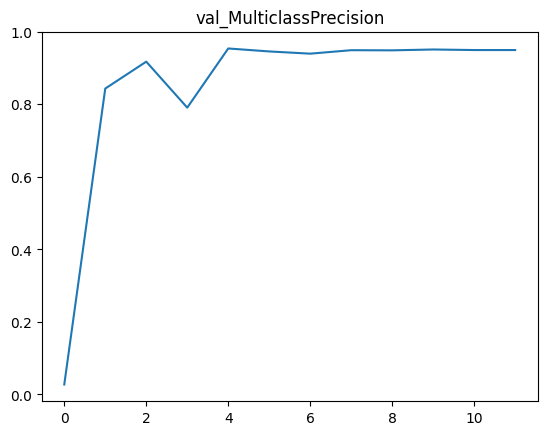

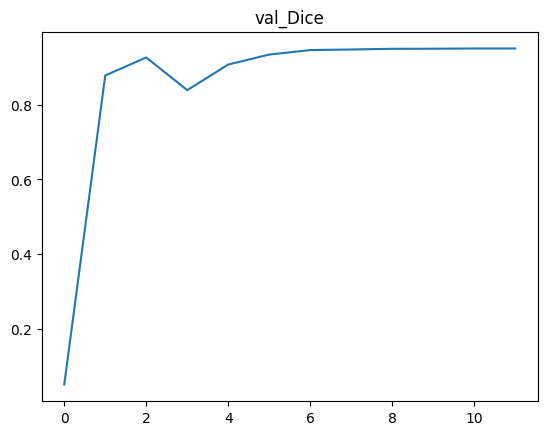

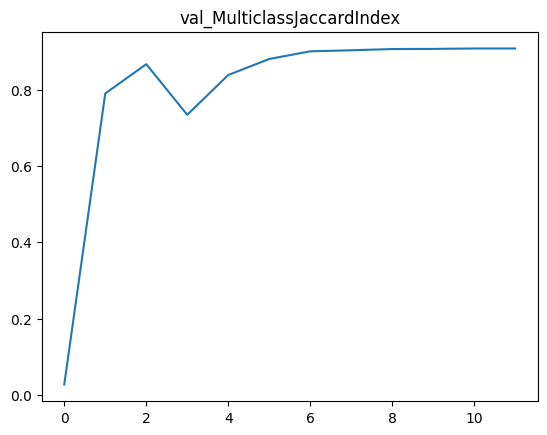

In [50]:
for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()

### Задание 3 (3 балла). Выбор другой функции ошибки

Полезная ссылка:
https://www.jeremyjordan.me/semantic-segmentation/#loss

Повторите эксперимент из задания 2, но попробуйте модифицировать функцию ошибки:
- (2 балла) учитывайте пиксели на границе объектов с большим весом, как предлагается в статье [U-Net](https://arxiv.org/abs/1505.04597)
- (1 балл) используйте soft Dice loss

Опишите свои наблюдения, что изменилось? Обратите внимание на скорость обучения, визуальные артефакты предсказаний, динамику метрик.


In [51]:
import os
import pandas as pd
import lightning as L
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision.utils import save_image
from torchmetrics import MetricCollection
from typing import Any

metrics_for_plot = {
            "val_loss": [],
            "val_MulticlassAccuracy": [],
            "val_MulticlassRecall": [],
            "val_MulticlassPrecision": [],
            "val_Dice": [],
            "val_MulticlassJaccardIndex": []
}

def soft_dice_loss(y_true_, y_pred, epsilon=1e-6):
    '''
    Soft dice loss calculation for arbitrary batch size, number of classes, and number of spatial dimensions.
    Assumes the `channels_last` format.

    # Arguments
        y_true: b x X x Y( x Z...) x c One hot encoding of ground truth
        y_pred: b x X x Y( x Z...) x c Network output, must sum to 1 over c channel (such as after softmax)
        epsilon: Used for numerical stability to avoid divide by zero errors

    # References
        V-Net: Fully Convolutional Neural Networks for Volumetric Medical Image Segmentation
        https://arxiv.org/abs/1606.04797
        More details on Dice loss formulation
        https://mediatum.ub.tum.de/doc/1395260/1395260.pdf (page 72)

        Adapted from https://github.com/Lasagne/Recipes/issues/99#issuecomment-347775022
    '''
    y_true = torch.nn.functional.one_hot(y_true_.long(), num_classes=3).permute(0, 3, 1, 2)
    # skip the batch and class axis for calculating Dice score
    axes = tuple(range(1, len(y_pred.shape)-1))
    numerator = 2. * torch.sum(y_pred * y_true, axes)
    denominator = torch.sum(torch.square(y_pred) + torch.square(y_true), axes)

    return 1 - torch.mean((numerator + epsilon) / (denominator + epsilon)) # average over classes and batch
    # thanks @mfernezir for catching a bug in an earlier version of this implementation!

class Lit(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x
        
        loss = soft_dice_loss(y, y_hat)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(
        self, batch: tuple[Tensor, Tensor], batch_idx: int
    ) -> STEP_OUTPUT | None:
        x, y = batch
        y_hat = self.model.forward(x)

        self.predictions = y_hat
        self.images = x

        loss = soft_dice_loss(y, y_hat)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {
            "loss": loss,
            "preds": y_hat,
        }

    def on_validation_epoch_end(self) -> None:
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_accuracy = self.trainer.callback_metrics["val_MulticlassAccuracy"]
        val_recall = self.trainer.callback_metrics["val_MulticlassRecall"]
        val_precision = self.trainer.callback_metrics["val_MulticlassPrecision"]
        val_jaccard = self.trainer.callback_metrics["val_MulticlassJaccardIndex"]
        val_dice = self.trainer.callback_metrics["val_Dice"]
        update(self.trainer.callback_metrics)
        print(f" Val. Loss: {val_loss:.4f},\n Val. Accuracy: {val_accuracy:.4f},\n Val. Recall: {val_recall:.4f},\n Val. Precision: {val_precision:.4f},\n Val. MulticlassJaccardIndex: {val_jaccard:.4f},\n Val. MulticlassDice: {val_dice:.4f}\n")
        print_result(self.predictions, self.images)
        self.val_metrics.reset()
        pass

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(
                optimizer, milestones=[5, 10, 15]
            ),
        }

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type             | Params | Mode 
-----------------------------------------------------------
0 | model         | UNet             | 268 K  | train
1 | train_metrics | MetricCollection | 0      | train
2 | val_metrics   | MetricCollection | 0      | train
-----------------------------------------------------------
268 K     Trainable params
0         Non-trainable params
268 K     Total params
1.074     Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.9129,
 Val. Accuracy: 0.0827,
 Val. Recall: 0.3333,
 Val. Precision: 0.0276,
 Val. MulticlassJaccardIndex: 0.0276,
 Val. MulticlassDice: 0.0509



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.5501,
 Val. Accuracy: 0.7376,
 Val. Recall: 0.5636,
 Val. Precision: 0.5854,
 Val. MulticlassJaccardIndex: 0.4371,
 Val. MulticlassDice: 0.5581



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0737,
 Val. Accuracy: 0.9332,
 Val. Recall: 0.8885,
 Val. Precision: 0.8706,
 Val. MulticlassJaccardIndex: 0.7911,
 Val. MulticlassDice: 0.8785



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1334,
 Val. Accuracy: 0.9049,
 Val. Recall: 0.8364,
 Val. Precision: 0.8216,
 Val. MulticlassJaccardIndex: 0.7160,
 Val. MulticlassDice: 0.8261



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0453,
 Val. Accuracy: 0.9461,
 Val. Recall: 0.8517,
 Val. Precision: 0.9574,
 Val. MulticlassJaccardIndex: 0.8184,
 Val. MulticlassDice: 0.8941



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0344,
 Val. Accuracy: 0.9571,
 Val. Recall: 0.9320,
 Val. Precision: 0.9210,
 Val. MulticlassJaccardIndex: 0.8656,
 Val. MulticlassDice: 0.9260



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0296,
 Val. Accuracy: 0.9638,
 Val. Recall: 0.9460,
 Val. Precision: 0.9330,
 Val. MulticlassJaccardIndex: 0.8879,
 Val. MulticlassDice: 0.9394



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0272,
 Val. Accuracy: 0.9658,
 Val. Recall: 0.9404,
 Val. Precision: 0.9437,
 Val. MulticlassJaccardIndex: 0.8925,
 Val. MulticlassDice: 0.9420



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0264,
 Val. Accuracy: 0.9669,
 Val. Recall: 0.9408,
 Val. Precision: 0.9468,
 Val. MulticlassJaccardIndex: 0.8955,
 Val. MulticlassDice: 0.9438



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0263,
 Val. Accuracy: 0.9671,
 Val. Recall: 0.9394,
 Val. Precision: 0.9487,
 Val. MulticlassJaccardIndex: 0.8958,
 Val. MulticlassDice: 0.9440



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=10` reached.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


 Val. Loss: 0.0258,
 Val. Accuracy: 0.9674,
 Val. Recall: 0.9435,
 Val. Precision: 0.9466,
 Val. MulticlassJaccardIndex: 0.8976,
 Val. MulticlassDice: 0.9450



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.0258,
 Val. Accuracy: 0.9674,
 Val. Recall: 0.9435,
 Val. Precision: 0.9466,
 Val. MulticlassJaccardIndex: 0.8976,
 Val. MulticlassDice: 0.9450

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
         val_Dice             0.945023775100708
  val_MulticlassAccuracy      0.9674243927001953
val_MulticlassJaccardIndex    0.8976047039031982
 val_MulticlassPrecision      0.946601390838623
   val_MulticlassRecall       0.9434587955474854
         val_loss            0.025775453075766563
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'val_loss': 0.025775453075766563,
  'val_MulticlassAccuracy': 0.9674243927001953,
  'val_MulticlassPrecision': 0.946601390838623,
  'val_MulticlassRecall': 0.9434587955474854,
  'val_MulticlassJaccardIndex': 0.8976047039031982,
  'val_Dice': 0.945023775100708}]

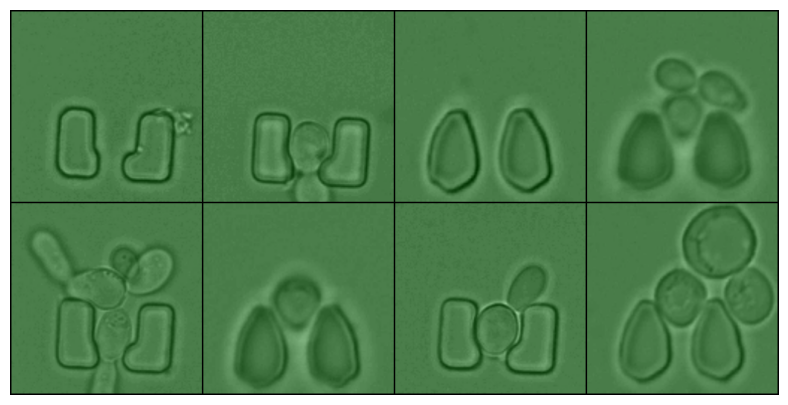

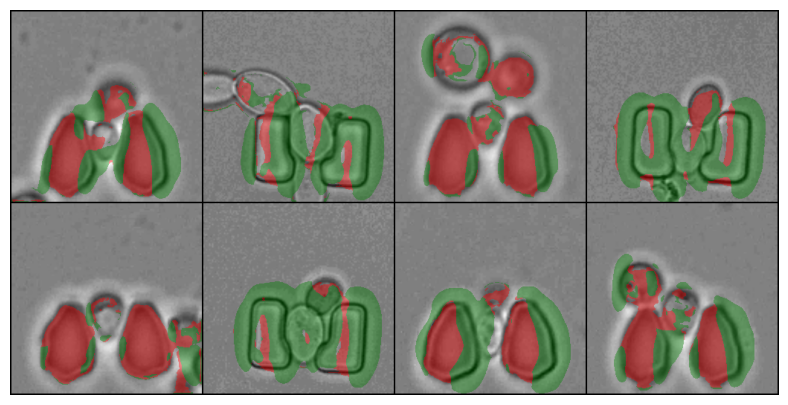

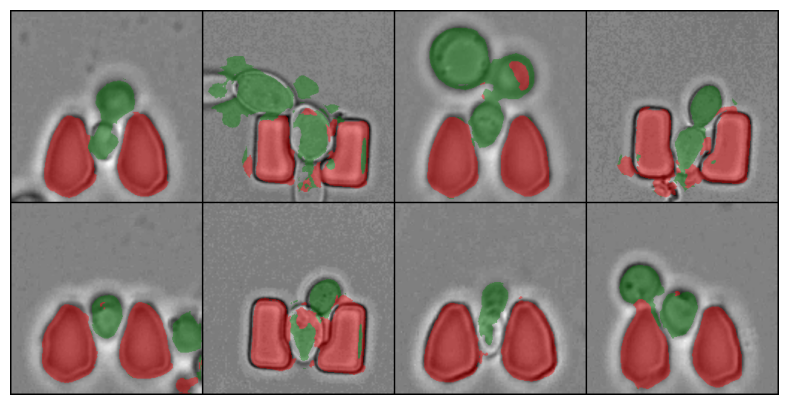

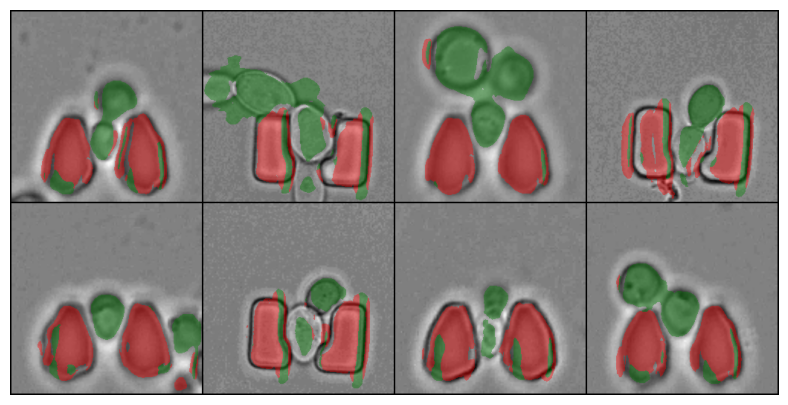

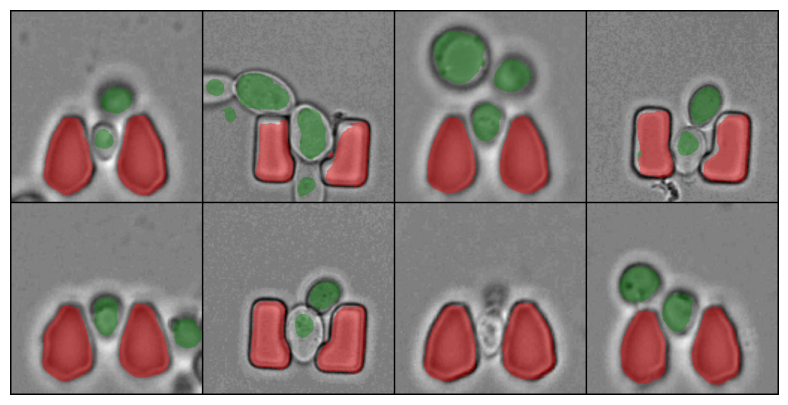

...

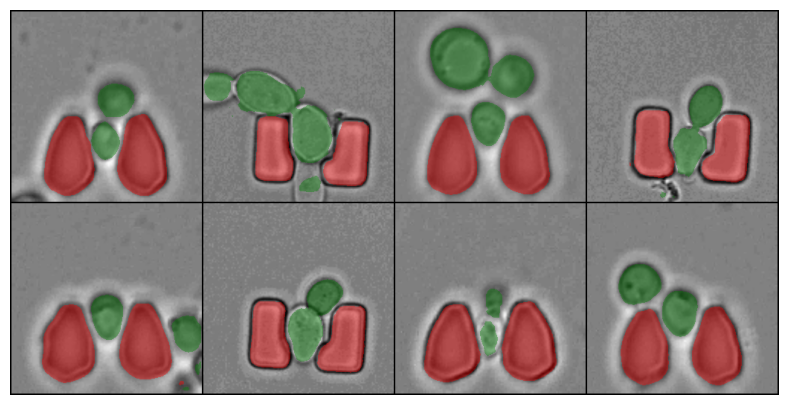

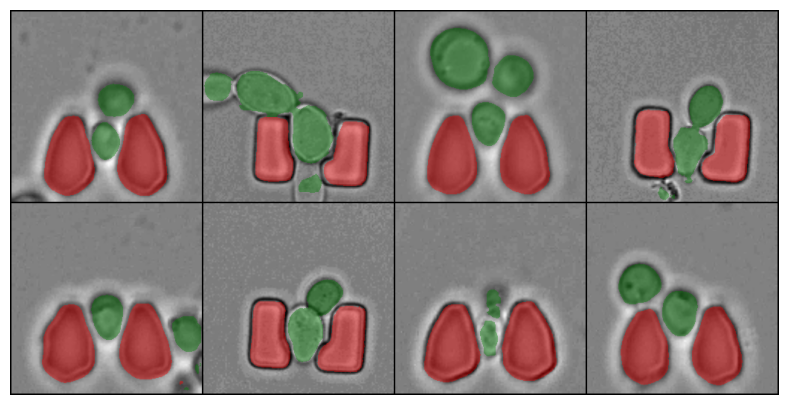

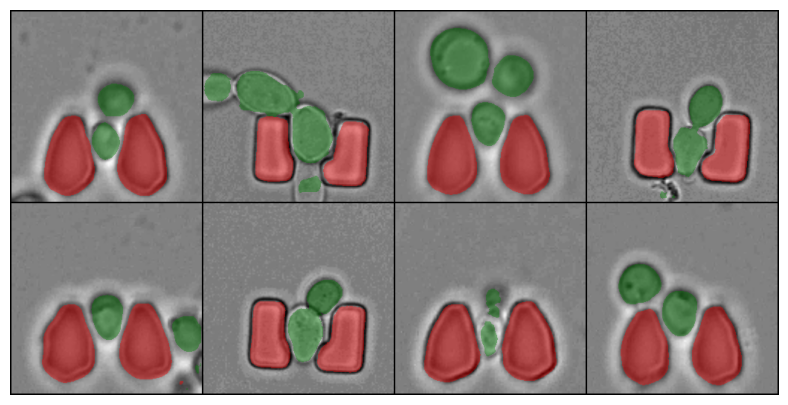

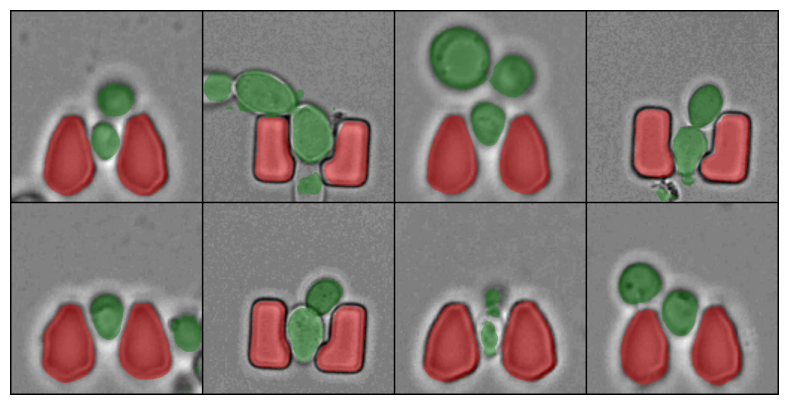

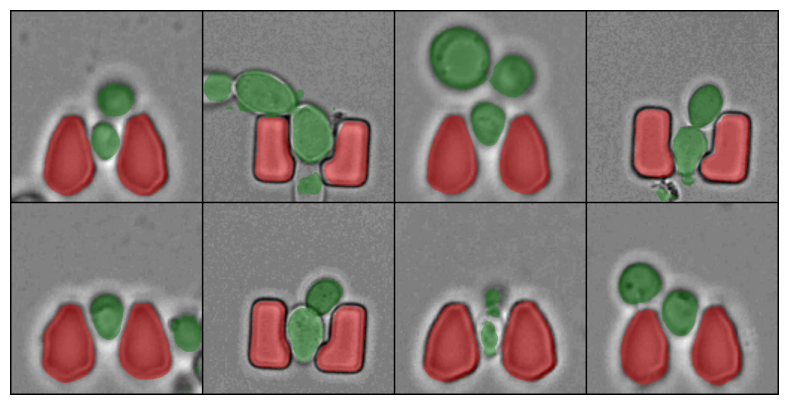

In [52]:
torch.manual_seed(42)
datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")
images, masks = next(iter(datamodule.train_dataloader()))

trainer = L.Trainer(
    accelerator="auto",
    max_epochs=10,
    limit_train_batches=None,
    limit_val_batches=None,
)
model = Lit(
    model = UNet(n_channels=1, n_classes=3, channel_sizes=[16, 32, 64, 128], bilinear=True),
    learning_rate=1e-3,
)

trainer.fit(
    model=model,
    datamodule=datamodule,
)

trainer.validate(model=model, dataloaders=datamodule.val_dataloader())


12


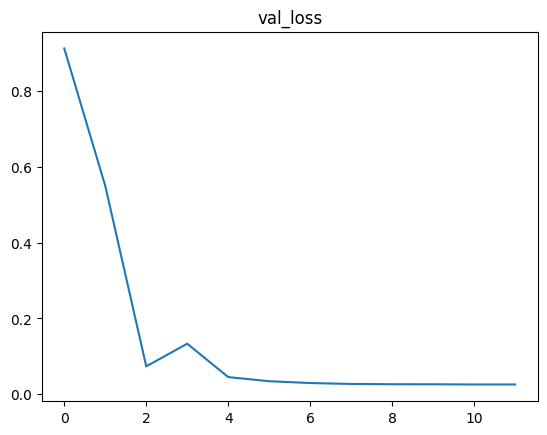

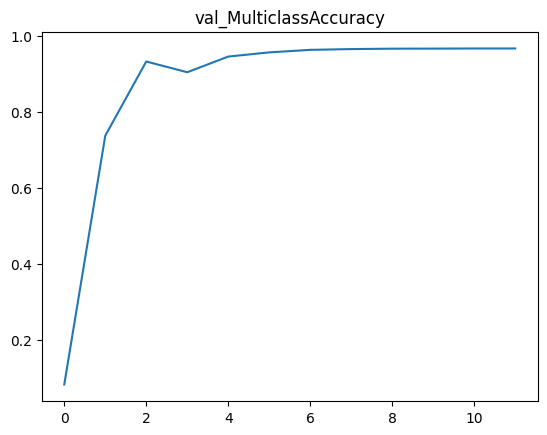

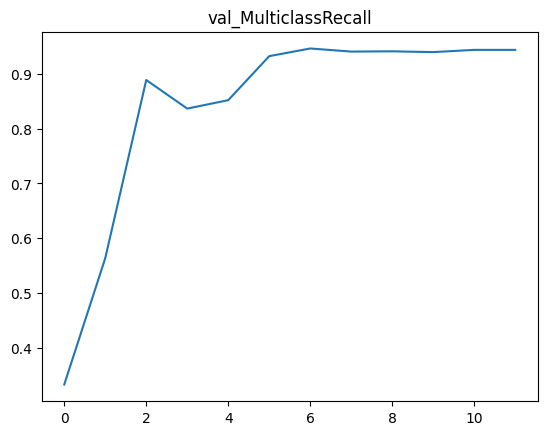

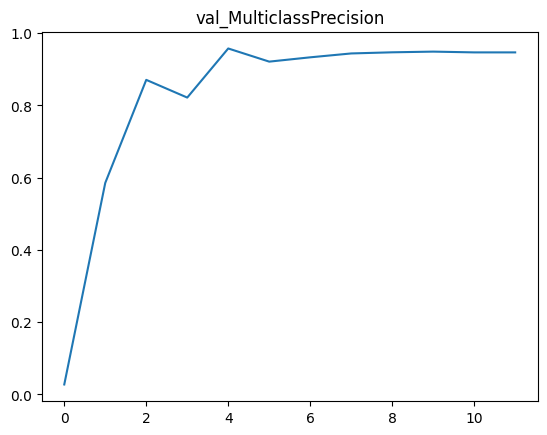

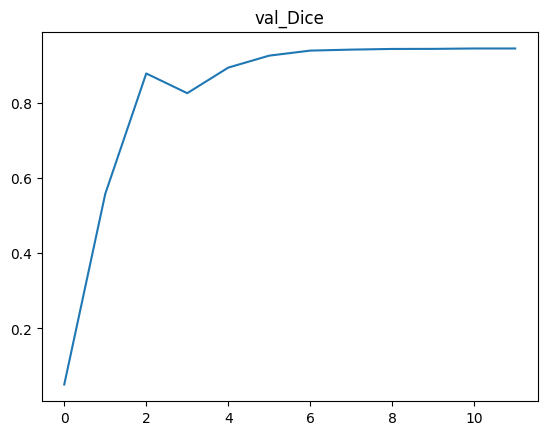

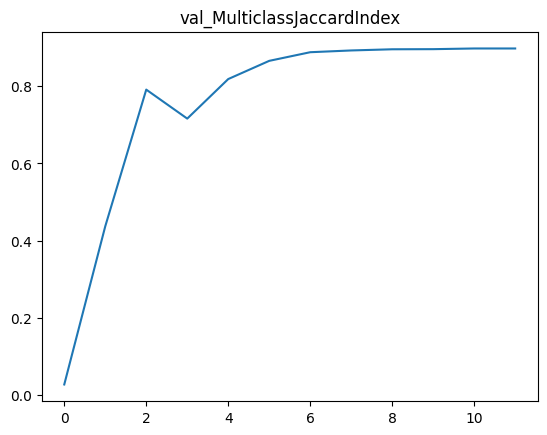

In [53]:
import matplotlib.pyplot as plt

print(len(metrics_for_plot[metric]))

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()


Можно заметить более что с первой эпохи у нас более выраженная граница, а также по графикам видно, что тренировочном датасете на второй эпохе во многих метриках наблюдается регресс и динамика обучения на первых эпохах идет быстрее



### Задание 4 (3 балла). Модификация архитектуры

Ваша задача - извлечь максимальную точность из модели, в которой будет не более 50k параметров. Для этого внесите правки в архитектуру модели.

В частности, попробуйте заменить в блоке `Down` комбинацию conv+maxpool на dilated conv (`nn.Conv2d(..., dilation=2)`). В остальном - полная свобода творчества, можете перерабатывать архитектуру как угодно.

Как обычно, запустите эксперимент (или несколько) с выводом всех графиков и картинок.

In [62]:
class DilatedConv(nn.Module):
    """(Dilated Conv => [BN] => ReLU)"""
    
    def __init__(
        self, in_channels: int, out_channels: int, dilation: int = 2
    ) -> None:
        super().__init__()
        self.dilated_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=dilation, dilation=dilation, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.dilated_conv(x)

class DownWithDilatedConv(nn.Module):
    """Downscaling with dilated conv instead of maxpool + double conv"""
    
    def __init__(self, in_channels: int, out_channels: int, dilation: int = 2) -> None:
        super().__init__()
        self.dilated_conv = nn.Sequential(
            DilatedConv(in_channels, out_channels, dilation),
            DilatedConv(out_channels, out_channels, dilation)
        )

    def forward(self, x: Tensor) -> Tensor:
        return self.dilated_conv(x)

class UNetWithDilatedDown(nn.Module):
    def __init__(
        self,
        n_channels: int,
        n_classes: int,
        channel_sizes: list[int],
        bilinear: bool = False,
    ):
        super().__init__()
        self.in_conv = DoubleConv(in_channels=n_channels, out_channels=channel_sizes[0])
        self.downscaler = self.create_downscaler(channel_sizes, bilinear)
        self.upscaler = self.create_upscaler(channel_sizes[::-1], bilinear)
        self.head = nn.Conv2d(channel_sizes[0], n_classes, kernel_size=1)

    @classmethod
    def create_downscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        """
        factor = 2 if bilinear else 1
        down_factors = [1] * (len(channel_sizes) - 2) + [factor]
        return nn.ModuleList(
            [
                DownWithDilatedConv(fin, fout // dfactor)
                for fin, fout, dfactor in zip(
                    channel_sizes[:-1], channel_sizes[1:], down_factors
                )
            ]
        )

    @classmethod
    def create_upscaler(
        cls, channel_sizes: list[int], bilinear: bool = False
    ) -> nn.ModuleList:
        """
        Создаём список модулей на основе размеров каналов.
        """
        factor = 2 if bilinear else 1
        up_factors = [factor] * (len(channel_sizes) - 2) + [1]
        return nn.ModuleList(
            [
                Up(fin, fout // ufactor, bilinear=bilinear)
                for fin, fout, ufactor in zip(channel_sizes[:-1], channel_sizes[1:], up_factors)
            ]
        )

    def forward(self, x: Tensor) -> Tensor:
        xs = []
        x = self.in_conv(x)

        for conv in self.downscaler:
            xs.append(x)
            x = conv(x)

        xs.reverse()
        for conv, act in zip(self.upscaler, xs):
            x = conv(x, act)

        logits = self.head(x)
        return logits


In [65]:
import torch
import torch.nn.functional as F
import torchvision
import lightning.pytorch as L
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch import nn, Tensor
from typing import Any

class LitUNetDilated(L.LightningModule):
    def __init__(self, model: nn.Module, learning_rate: float) -> None:
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.learning_rate = learning_rate
        self.train_metrics = create_classification_metrics(num_classes=3, prefix="train_")
        self.val_metrics = create_classification_metrics(num_classes=3, prefix="val_")
        self.predictions = None
        self.images = None

    def training_step(self, batch: tuple[Tensor, Tensor], batch_idx: int) -> Tensor:
        x, y = batch
        y_hat = self.model(x)

        self.predictions = y_hat
        self.images = x
        
        loss = F.cross_entropy(y_hat, y)
        self.log("train_loss", loss, on_epoch=True, on_step=False)
        self.train_metrics.update(y_hat, y)
        self.log_dict(self.train_metrics, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch: tuple[Tensor, Tensor], batch_idx: int) -> dict[str, Any]:
        x, y = batch
        y_hat = self.model(x)

        self.predictions = y_hat
        self.images = x

        loss = F.cross_entropy(y_hat, y)
        self.log("val_loss", loss, on_epoch=True, on_step=False)
        self.val_metrics.update(y_hat, y)
        self.log_dict(self.val_metrics, on_step=False, on_epoch=True)

        return {"loss": loss, "preds": y_hat}

    def on_validation_epoch_end(self) -> None:
        update(self.trainer.callback_metrics)
        print_result(self.predictions, self.images)
        self.val_metrics.reset()

    def configure_optimizers(self) -> dict[str, Any]:
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate, weight_decay=1e-4)
        return {
            "optimizer": optimizer,
            "lr_scheduler": torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=[5, 10, 15]),
        }

def print_result(predictions, images):
    original_images_grid = torchvision.utils.make_grid(images, nrow=4, normalize=True)
    masks_grid = torchvision.utils.make_grid(
        torch.nn.functional.one_hot(predictions.argmax(dim=1), 3).permute(0, 3, 1, 2)[:, 1:] > 0,
        nrow=4,
    )

    predictions_grid = torchvision.utils.draw_segmentation_masks(
        original_images_grid,
        masks=masks_grid,
        alpha=0.4,
        colors=["red", "green"],
    )

    plt.figure(figsize=(12, 5))
    plt.axis("off")
    plt.imshow(transforms.ToPILImage()(predictions_grid))

metrics_for_plot = {
    "val_loss": [],
    "val_MulticlassAccuracy": [],
    "val_MulticlassRecall": [],
    "val_MulticlassPrecision": [],
    "val_Dice": [],
    "val_MulticlassJaccardIndex": []
}

def update(res):
    for h in metrics_for_plot:
        metrics_for_plot[h].append(float(res[h]))


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type                | Params | Mode 
--------------------------------------------------------------
0 | model         | UNetWithDilatedDown | 16.5 K | train
1 | train_metrics | MetricCollection    | 0      | train
2 | val_metrics   | MetricCollection    | 0      | train
--------------------------------------------------------------
16.5 K    Trainable params
0         Non-trainable params
16.5 K    Total params
0.066     Total estimated model params size (MB)
68        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 1.1619,
 Val. Accuracy: 0.0827,
 Val. Recall: 0.3333,
 Val. Precision: 0.0305,
 Val. MulticlassJaccardIndex: 0.0276,
 Val. MulticlassDice: 0.0510



Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1981,
 Val. Accuracy: 0.7895,
 Val. Recall: 0.5554,
 Val. Precision: 0.5962,
 Val. MulticlassJaccardIndex: 0.4360,
 Val. MulticlassDice: 0.5520



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1588,
 Val. Accuracy: 0.8113,
 Val. Recall: 0.5101,
 Val. Precision: 0.6964,
 Val. MulticlassJaccardIndex: 0.4326,
 Val. MulticlassDice: 0.5459



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1609,
 Val. Accuracy: 0.8042,
 Val. Recall: 0.4923,
 Val. Precision: 0.6976,
 Val. MulticlassJaccardIndex: 0.4171,
 Val. MulticlassDice: 0.5341



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1381,
 Val. Accuracy: 0.8296,
 Val. Recall: 0.5762,
 Val. Precision: 0.7064,
 Val. MulticlassJaccardIndex: 0.4898,
 Val. MulticlassDice: 0.6092



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1330,
 Val. Accuracy: 0.8359,
 Val. Recall: 0.5821,
 Val. Precision: 0.7412,
 Val. MulticlassJaccardIndex: 0.5012,
 Val. MulticlassDice: 0.6212



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1274,
 Val. Accuracy: 0.8412,
 Val. Recall: 0.6157,
 Val. Precision: 0.7332,
 Val. MulticlassJaccardIndex: 0.5262,
 Val. MulticlassDice: 0.6508



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1245,
 Val. Accuracy: 0.8447,
 Val. Recall: 0.6206,
 Val. Precision: 0.7422,
 Val. MulticlassJaccardIndex: 0.5317,
 Val. MulticlassDice: 0.6543



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1237,
 Val. Accuracy: 0.8458,
 Val. Recall: 0.6286,
 Val. Precision: 0.7418,
 Val. MulticlassJaccardIndex: 0.5370,
 Val. MulticlassDice: 0.6604



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1225,
 Val. Accuracy: 0.8476,
 Val. Recall: 0.6370,
 Val. Precision: 0.7424,
 Val. MulticlassJaccardIndex: 0.5424,
 Val. MulticlassDice: 0.6648



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1213,
 Val. Accuracy: 0.8490,
 Val. Recall: 0.6441,
 Val. Precision: 0.7448,
 Val. MulticlassJaccardIndex: 0.5496,
 Val. MulticlassDice: 0.6743



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1211,
 Val. Accuracy: 0.8493,
 Val. Recall: 0.6423,
 Val. Precision: 0.7469,
 Val. MulticlassJaccardIndex: 0.5495,
 Val. MulticlassDice: 0.6739



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1212,
 Val. Accuracy: 0.8496,
 Val. Recall: 0.6458,
 Val. Precision: 0.7461,
 Val. MulticlassJaccardIndex: 0.5518,
 Val. MulticlassDice: 0.6766



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1211,
 Val. Accuracy: 0.8493,
 Val. Recall: 0.6429,
 Val. Precision: 0.7456,
 Val. MulticlassJaccardIndex: 0.5491,
 Val. MulticlassDice: 0.6731



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1209,
 Val. Accuracy: 0.8496,
 Val. Recall: 0.6416,
 Val. Precision: 0.7472,
 Val. MulticlassJaccardIndex: 0.5490,
 Val. MulticlassDice: 0.6727



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1207,
 Val. Accuracy: 0.8500,
 Val. Recall: 0.6434,
 Val. Precision: 0.7479,
 Val. MulticlassJaccardIndex: 0.5509,
 Val. MulticlassDice: 0.6750



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1208,
 Val. Accuracy: 0.8496,
 Val. Recall: 0.6421,
 Val. Precision: 0.7467,
 Val. MulticlassJaccardIndex: 0.5494,
 Val. MulticlassDice: 0.6732



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1207,
 Val. Accuracy: 0.8499,
 Val. Recall: 0.6436,
 Val. Precision: 0.7474,
 Val. MulticlassJaccardIndex: 0.5506,
 Val. MulticlassDice: 0.6745



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1207,
 Val. Accuracy: 0.8500,
 Val. Recall: 0.6456,
 Val. Precision: 0.7469,
 Val. MulticlassJaccardIndex: 0.5515,
 Val. MulticlassDice: 0.6756



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1211,
 Val. Accuracy: 0.8495,
 Val. Recall: 0.6408,
 Val. Precision: 0.7471,
 Val. MulticlassJaccardIndex: 0.5488,
 Val. MulticlassDice: 0.6725



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1207,
 Val. Accuracy: 0.8499,
 Val. Recall: 0.6451,
 Val. Precision: 0.7463,
 Val. MulticlassJaccardIndex: 0.5512,
 Val. MulticlassDice: 0.6753



/tmp/ipykernel_840/1313133419.py:75: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 5))


Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1207,
 Val. Accuracy: 0.8500,
 Val. Recall: 0.6437,
 Val. Precision: 0.7475,
 Val. MulticlassJaccardIndex: 0.5510,
 Val. MulticlassDice: 0.6750



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1208,
 Val. Accuracy: 0.8499,
 Val. Recall: 0.6434,
 Val. Precision: 0.7470,
 Val. MulticlassJaccardIndex: 0.5505,
 Val. MulticlassDice: 0.6745



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1206,
 Val. Accuracy: 0.8501,
 Val. Recall: 0.6454,
 Val. Precision: 0.7472,
 Val. MulticlassJaccardIndex: 0.5521,
 Val. MulticlassDice: 0.6764



Validation: |          | 0/? [00:00<?, ?it/s]

 Val. Loss: 0.1208,
 Val. Accuracy: 0.8500,
 Val. Recall: 0.6469,
 Val. Precision: 0.7462,
 Val. MulticlassJaccardIndex: 0.5522,
 Val. MulticlassDice: 0.6766



Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=25` reached.


 Val. Loss: 0.1206,
 Val. Accuracy: 0.8501,
 Val. Recall: 0.6443,
 Val. Precision: 0.7474,
 Val. MulticlassJaccardIndex: 0.5512,
 Val. MulticlassDice: 0.6751



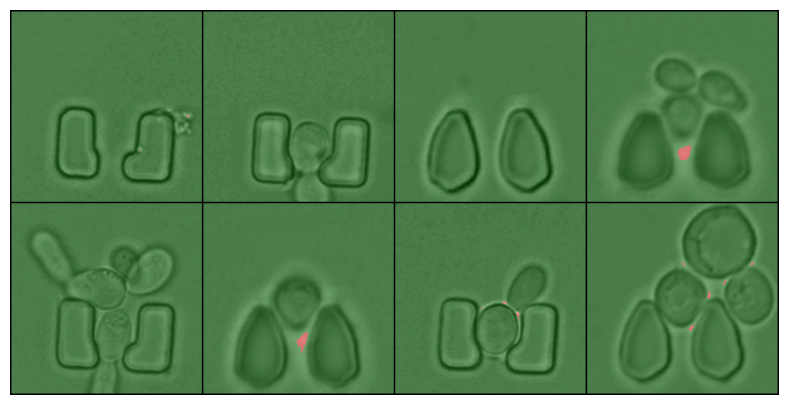

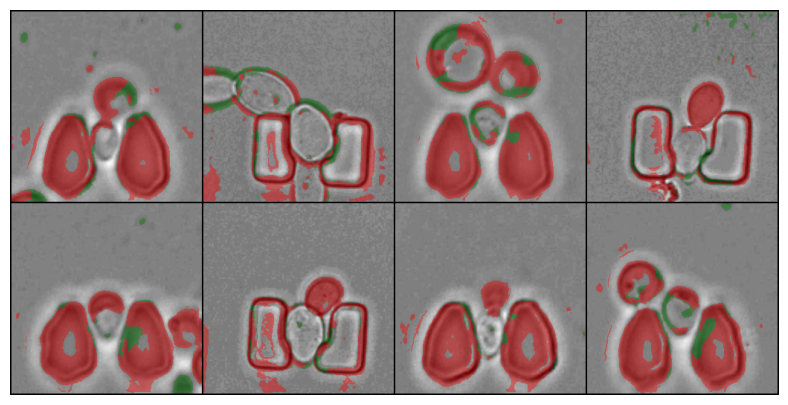

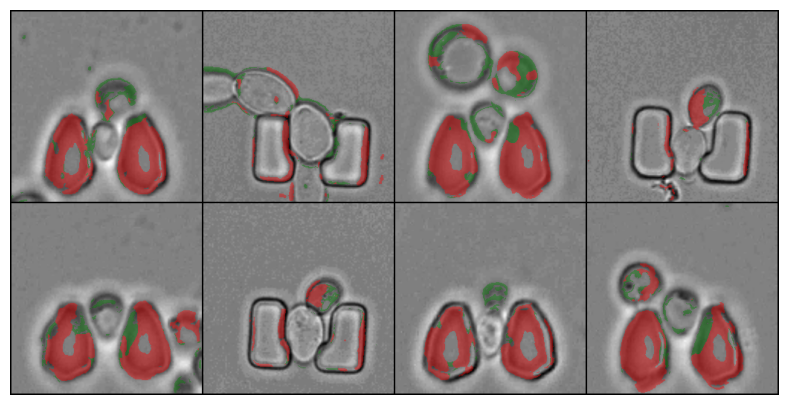

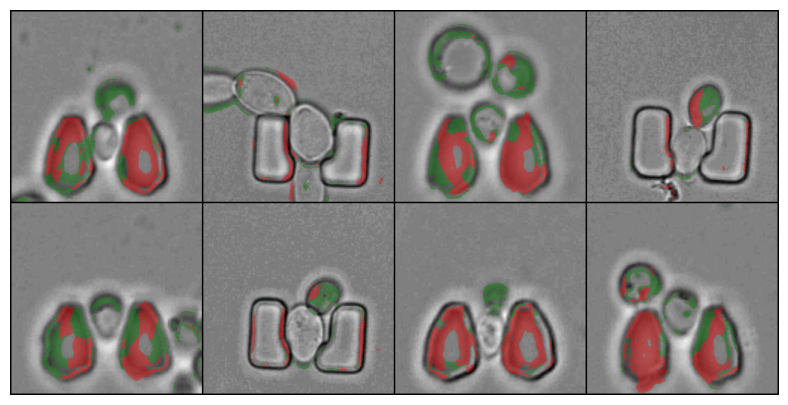

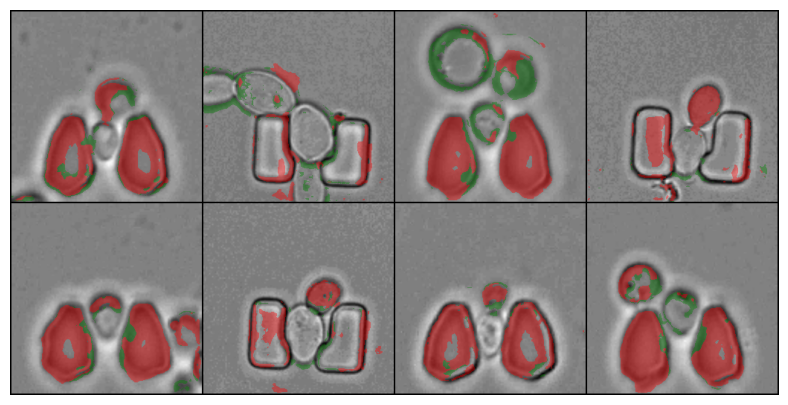

...

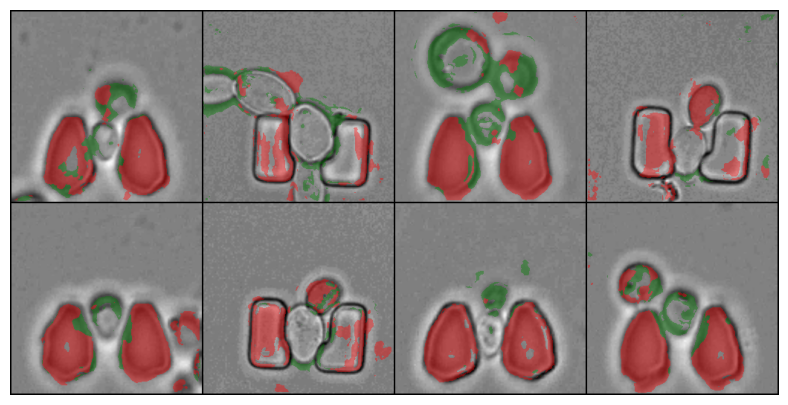

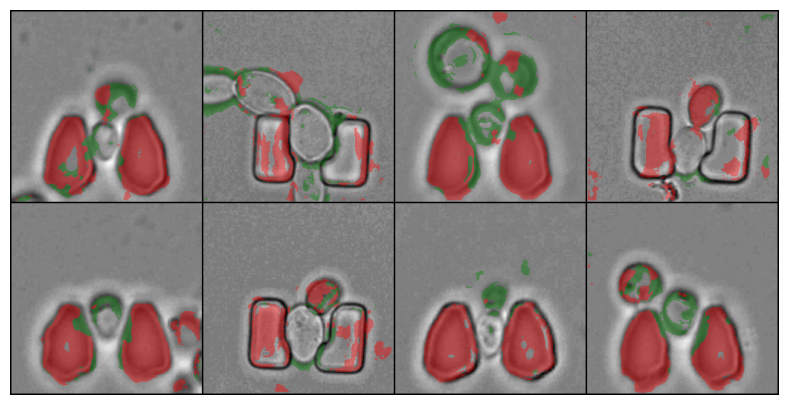

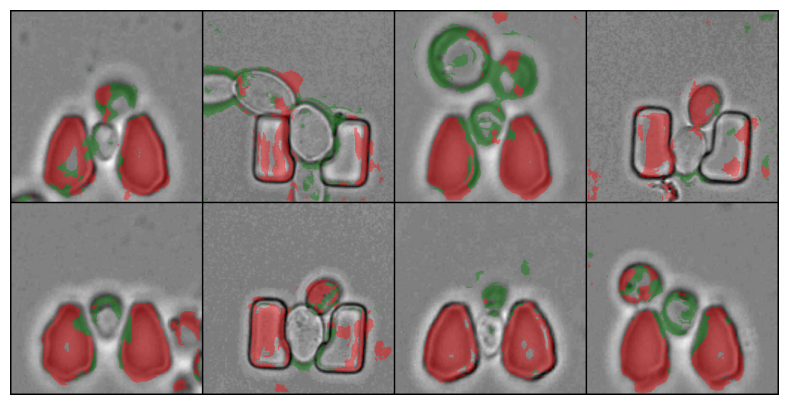

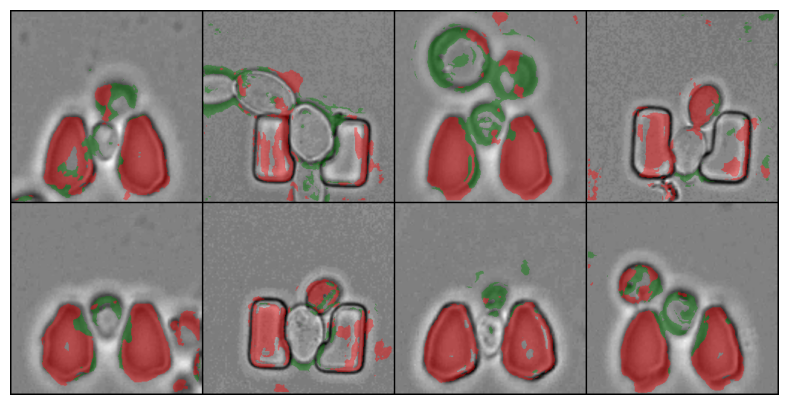

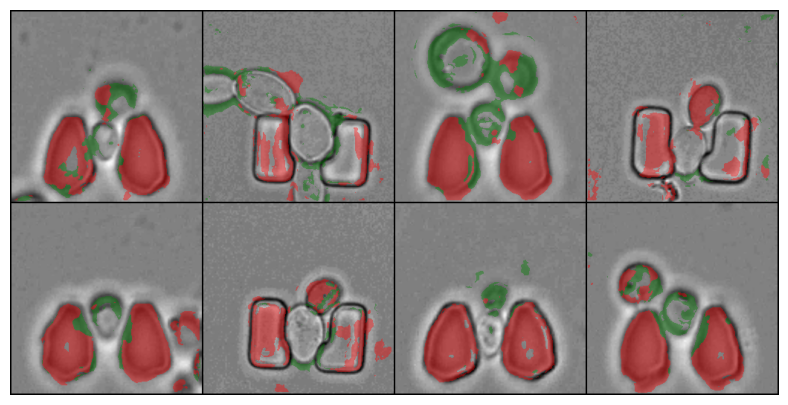

In [66]:
from lightning.pytorch.loggers import TensorBoardLogger
import torch
from pathlib import Path
import lightning.pytorch as L

torch.manual_seed(42)

datamodule = Datamodule(
    datadir=Path("yeast_cell_in_microstructures_dataset"),
    dataset_class=YeastSemanticSegmDataset,
    batch_size=8,
)
datamodule.setup("fit")

new_model = UNetWithDilatedDown(n_channels=1, n_classes=3, channel_sizes=[8, 16, 32], bilinear=True)

lit_module = Lit(new_model, learning_rate=0.003)

trainer = L.Trainer(
    accelerator="auto",
    max_epochs=25,
    logger=TensorBoardLogger(save_dir="."),
)

trainer.fit(
    model=lit_module,  
    datamodule=datamodule,
)


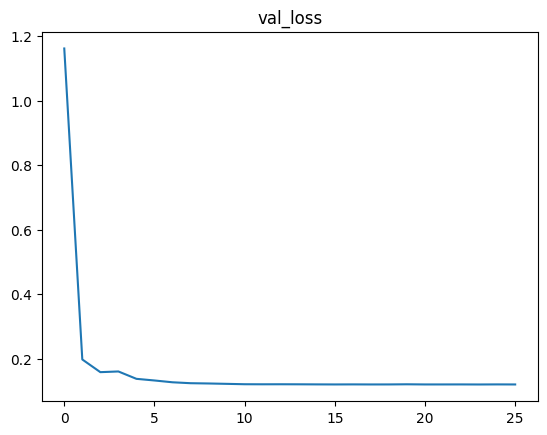

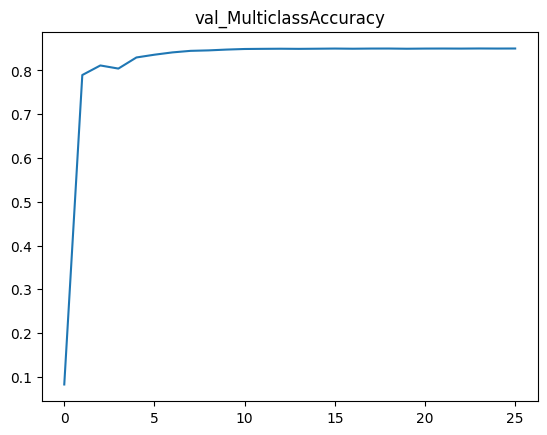

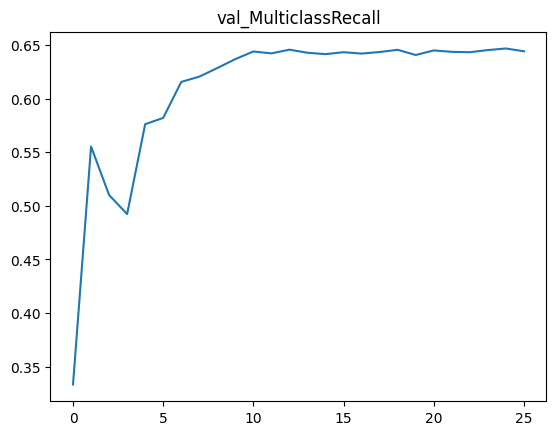

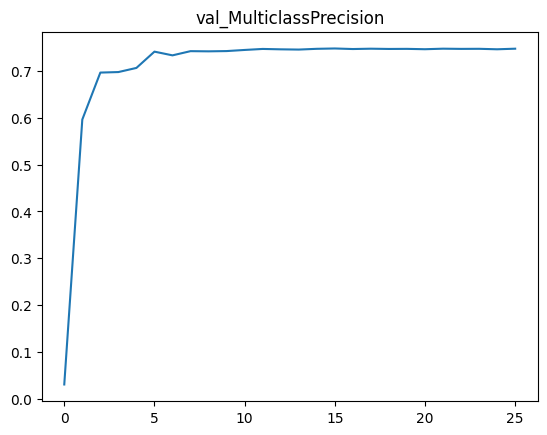

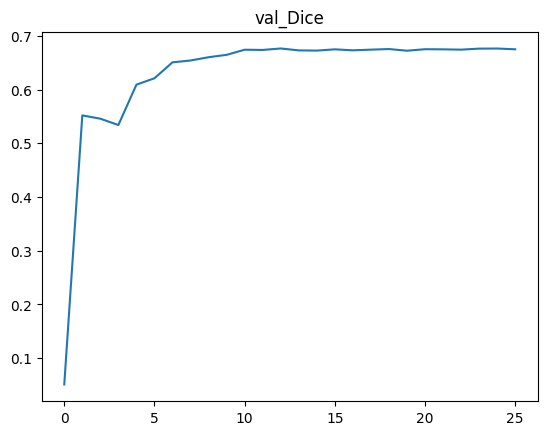

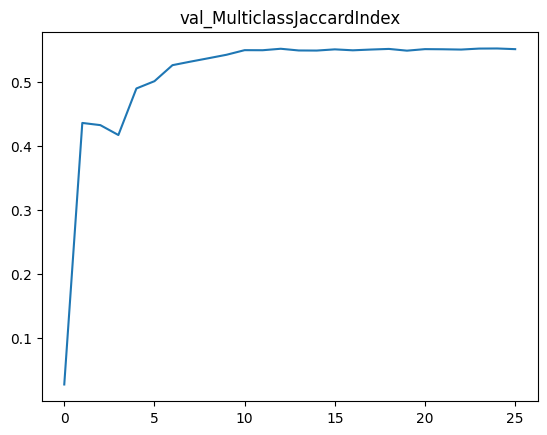

In [67]:
import matplotlib.pyplot as plt

for metric in metrics_for_plot:
  plt.title(metric)
  plt.plot(range(len(metrics_for_plot[metric])), metrics_for_plot[metric])
  plt.show()